In [ ]:
from google.colab import drive
drive.mount('/content/drive')

FOLDER_NAME = 'mlzoomcamp/capstone2'

import sys
sys.path.append(f'/content/drive/My Drive/{FOLDER_NAME}')

Mounted at /content/drive


In [ ]:
IMAGE_DATASET = f'/content/drive/My Drive/{FOLDER_NAME}/materials'

In [ ]:
import os
import matplotlib.pyplot as plt
import shutil
import random
from PIL import Image

In [ ]:
materials_folders = os.listdir(IMAGE_DATASET)
materials_folders

['paper',
 'metal',
 'cardboard',
 'food_organics',
 'glass',
 'vegetation',
 'textile_trash',
 'miscellaneous_trash',
 'plastic']

In [ ]:
import re

for folder_name in materials_folders:
  new_folder_name = re.sub(r"[ ]+", "_", folder_name.lower())
  if folder_name != new_folder_name:
    os.rename(os.path.join(IMAGE_DATASET, folder_name), os.path.join(IMAGE_DATASET, new_folder_name))
materials_folders = os.listdir(IMAGE_DATASET)
materials_folders

['paper',
 'metal',
 'cardboard',
 'food_organics',
 'glass',
 'vegetation',
 'textile_trash',
 'miscellaneous_trash',
 'plastic']

In [ ]:
image_count = 0
for material_folder in materials_folders:
    material_path = os.path.join(IMAGE_DATASET, material_folder)
    if os.path.isdir(material_path):
        images = os.listdir(material_path)
        image_count += len(images)

print(f"Total number of images in the dataset: {image_count}")

Total number of images in the dataset: 4752


In [ ]:
to_skip = []
for material_folder in materials_folders:
  folder_path = os.path.join(IMAGE_DATASET, material_folder)
  for file_name in os.listdir(folder_path):
    file_path = os.path.join(folder_path, file_name)
    with open(file_path, 'rb') as f:
      is_jfif = b"JFIF" in f.peek(10)
      if not is_jfif:
        to_skip.append(file_name)
        print(f'{file_path} is not a valid JPEG file')

print(f'Total number of files to skip: {len(to_skip)}')
print(to_skip)

# print the array to a file, one element per line
with open(f'/content/drive/My Drive/{FOLDER_NAME}/to_skip.txt', 'w') as f:
    for item in to_skip:
        f.write("%s\n" % item)

Total number of files to skip: 0
[]


In [ ]:
to_skip = []
with open(f'/content/drive/My Drive/{FOLDER_NAME}/to_skip.txt', 'r') as f:
    for line in f:
        to_skip.append(line.strip())
print(f'Total number of files to skip: {len(to_skip)}')
to_skip

Total number of files to skip: 0


[]

Total number of usable images in the dataset: 4752


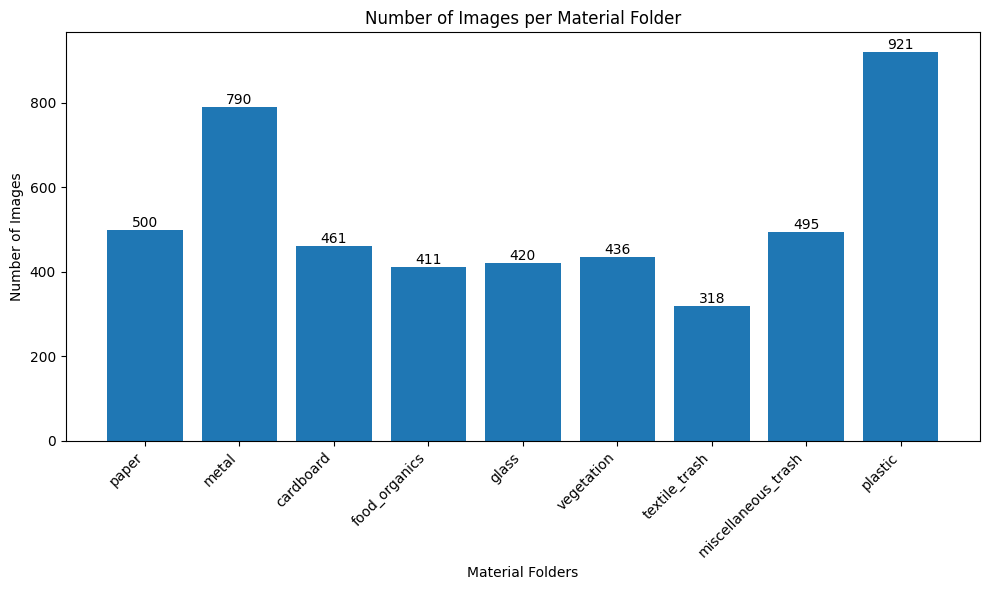

In [ ]:
image_counts = {}
for material_folder in materials_folders:
    material_path = os.path.join(IMAGE_DATASET, material_folder)
    if os.path.isdir(material_path):
        image_count = len([f for f in os.listdir(material_path) if f not in to_skip])
        image_counts[material_folder] = image_count

total_images = sum(image_counts.values())
print(f"Total number of usable images in the dataset: {total_images}")

plt.figure(figsize=(10, 6))
plt.bar(image_counts.keys(), image_counts.values())
plt.xlabel("Material Folders")
plt.ylabel("Number of Images")
plt.title("Number of Images per Material Folder")
plt.xticks(rotation=45, ha='right')
for i, v in enumerate(image_counts.values()):
    plt.text(i, v, str(v), ha='center', va='bottom')
plt.tight_layout()
plt.show()

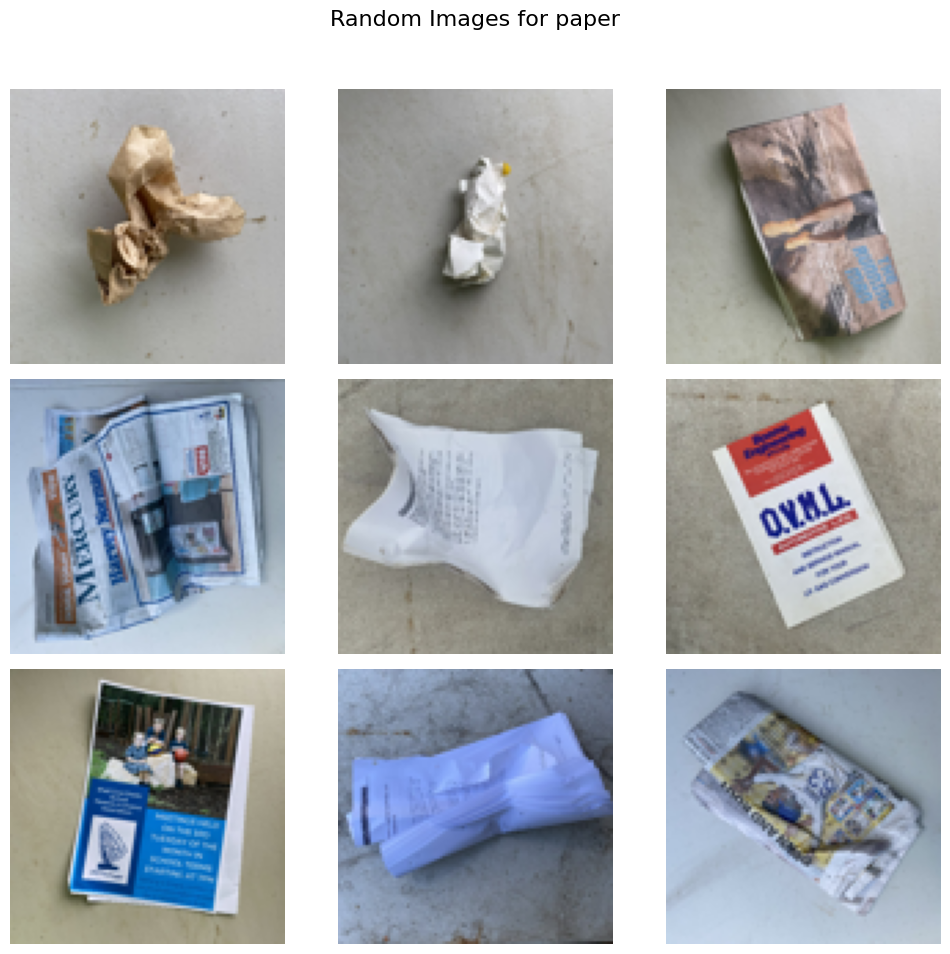

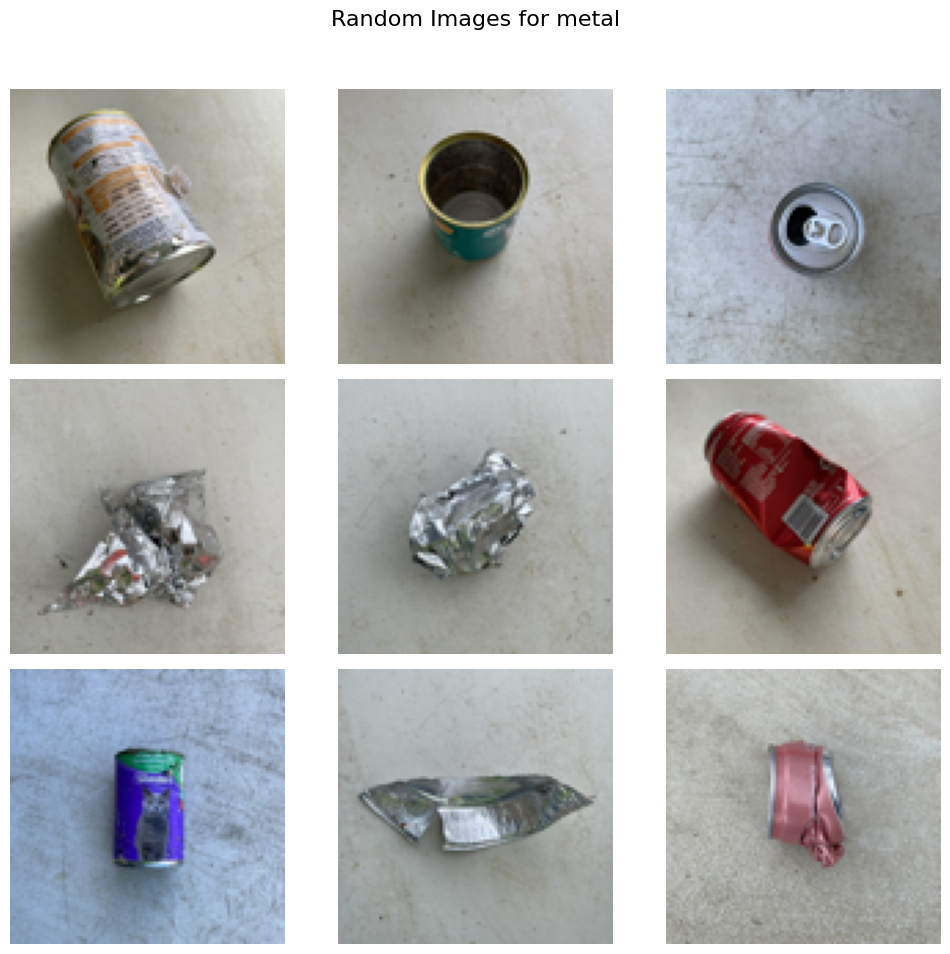

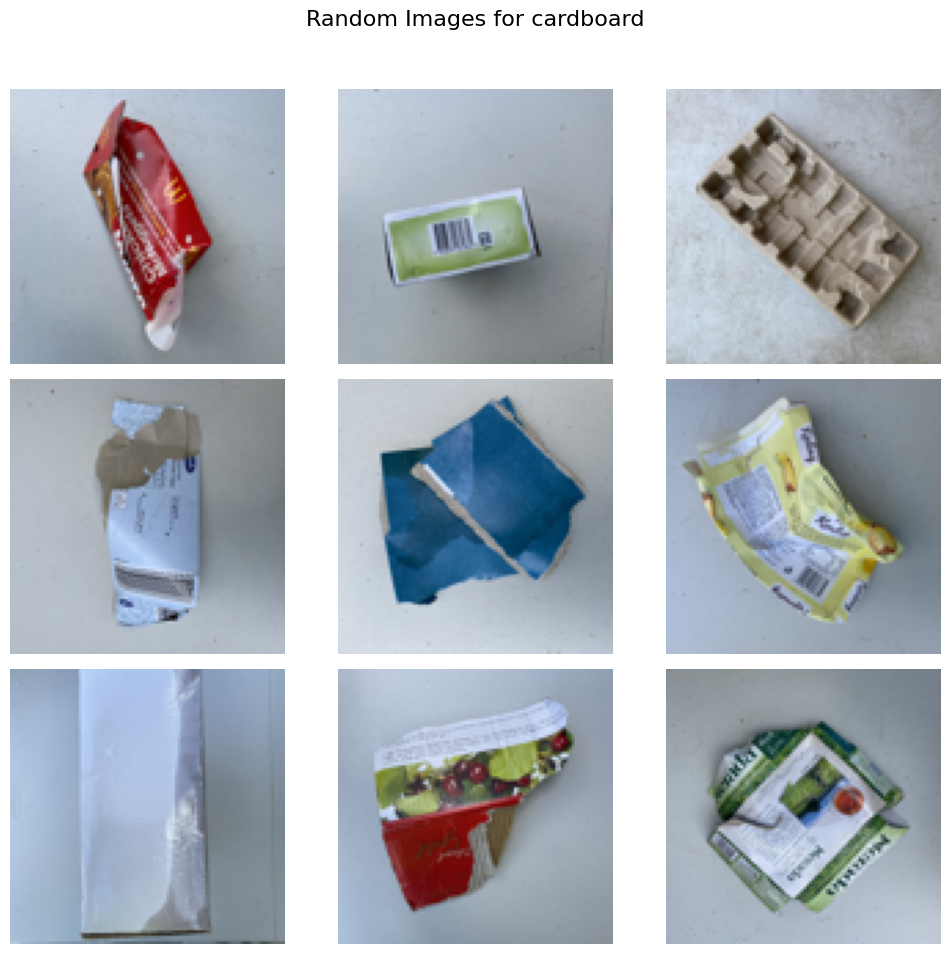

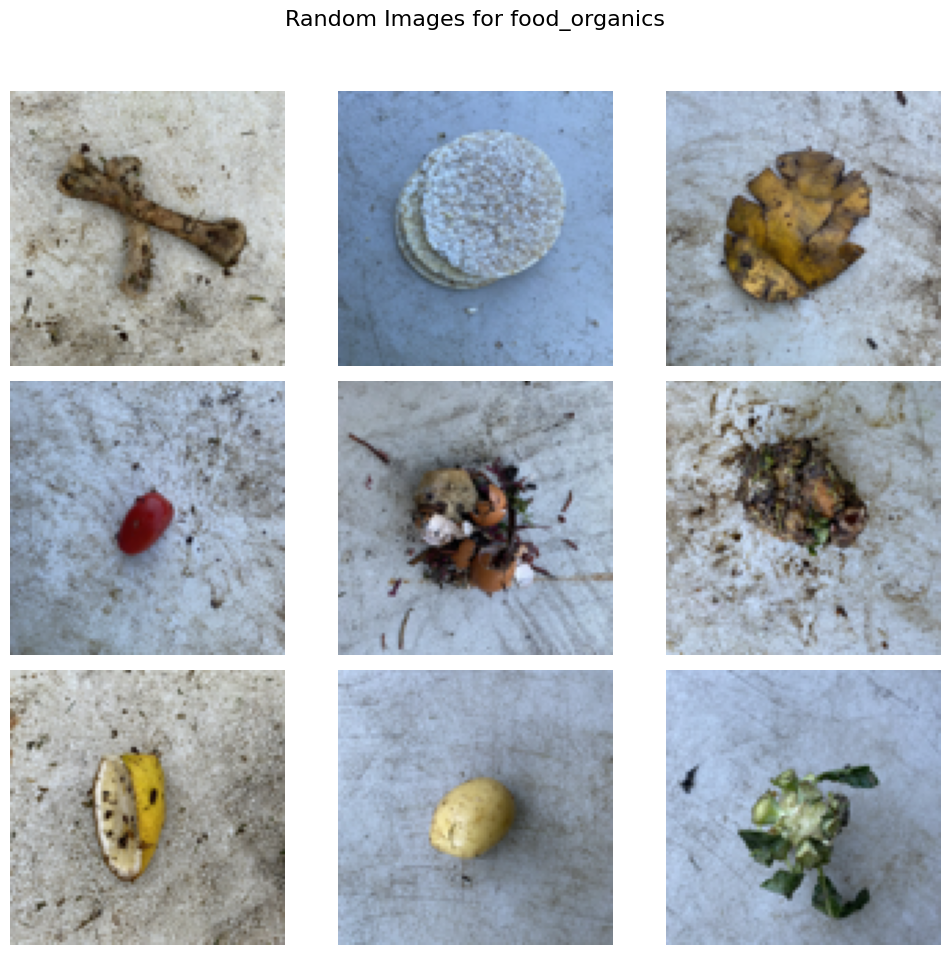

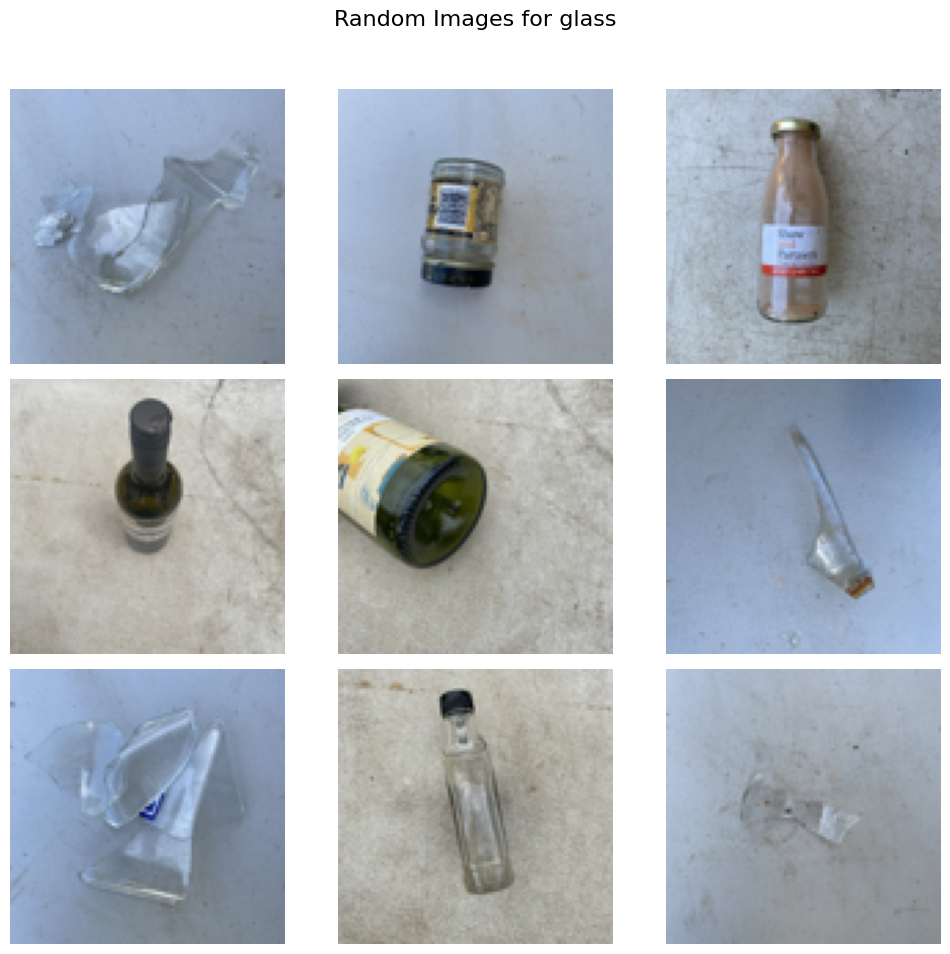

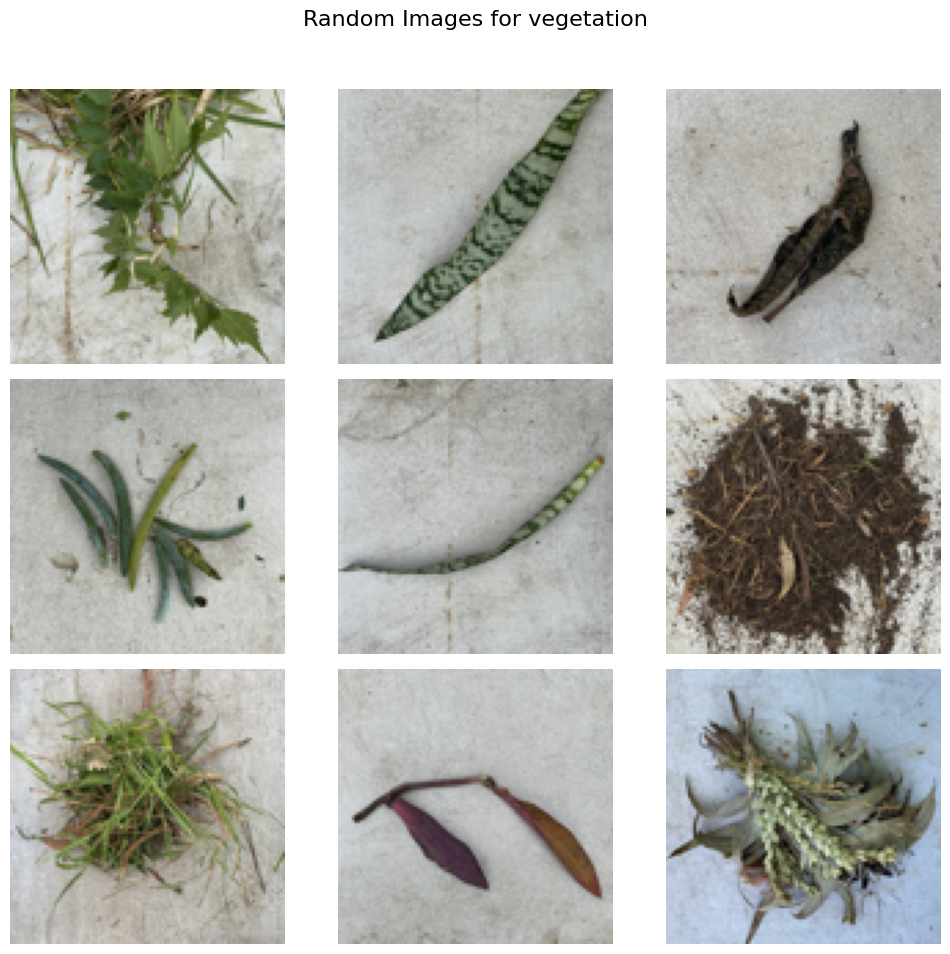

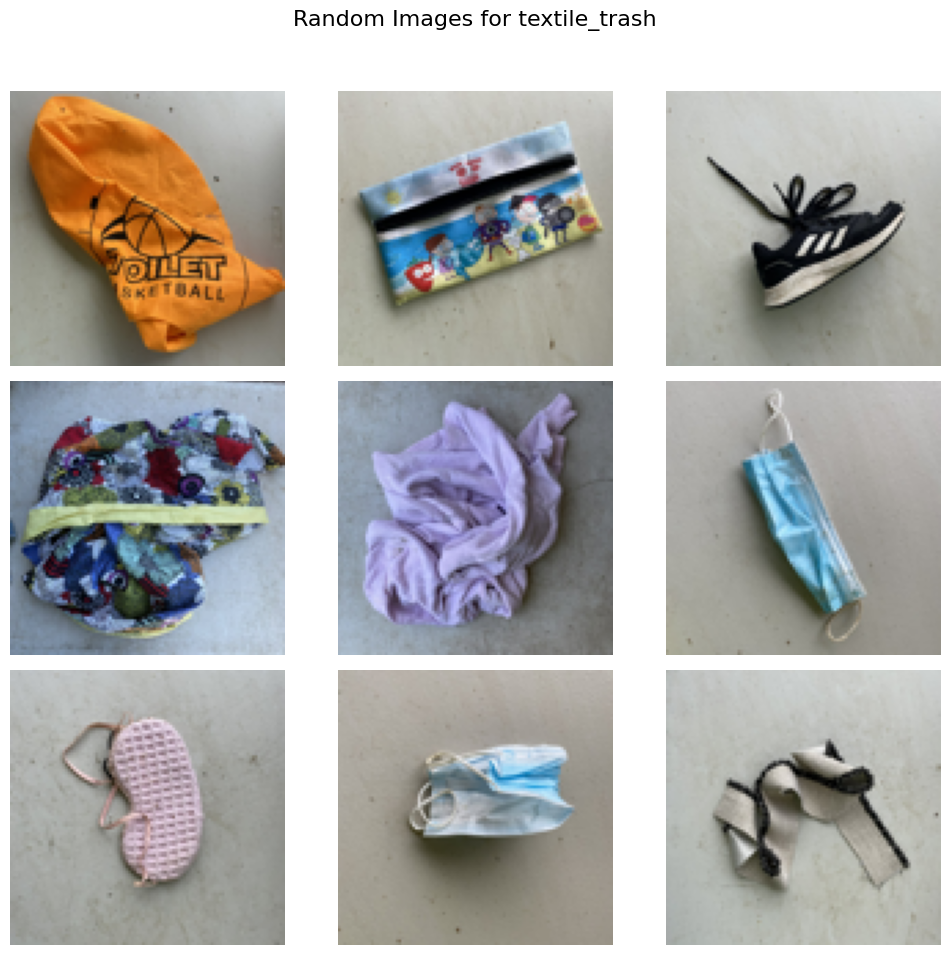

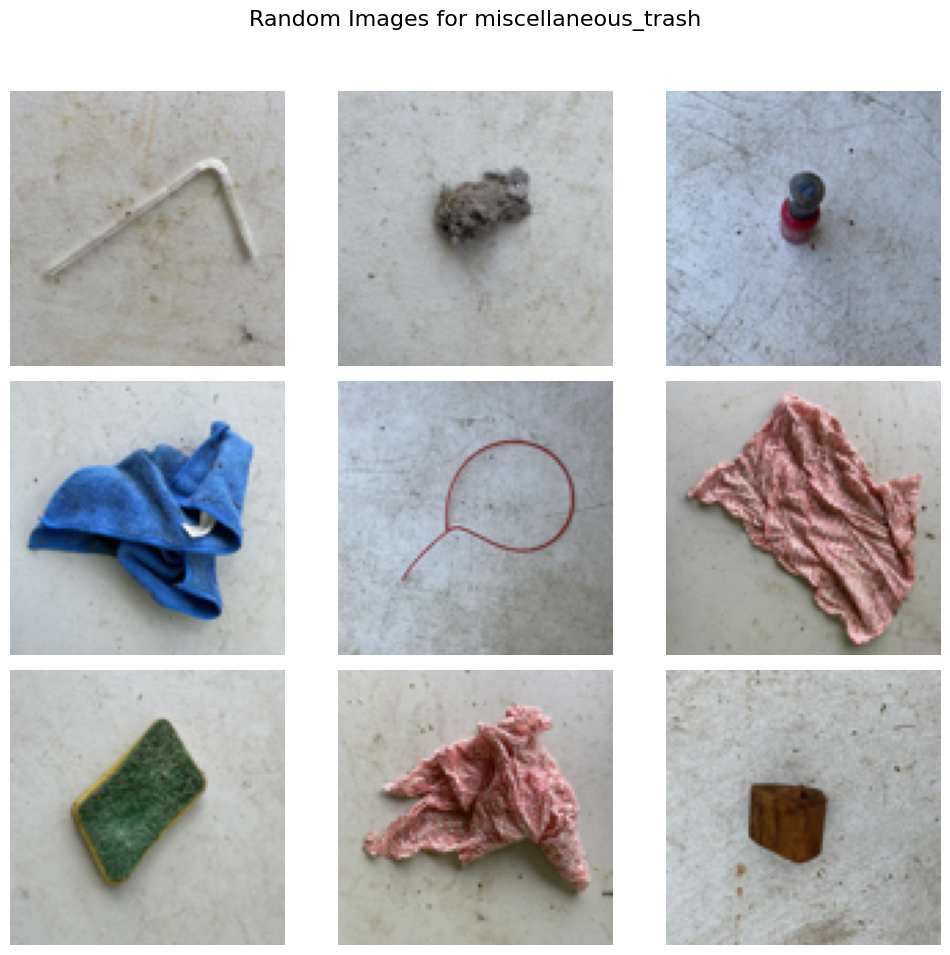

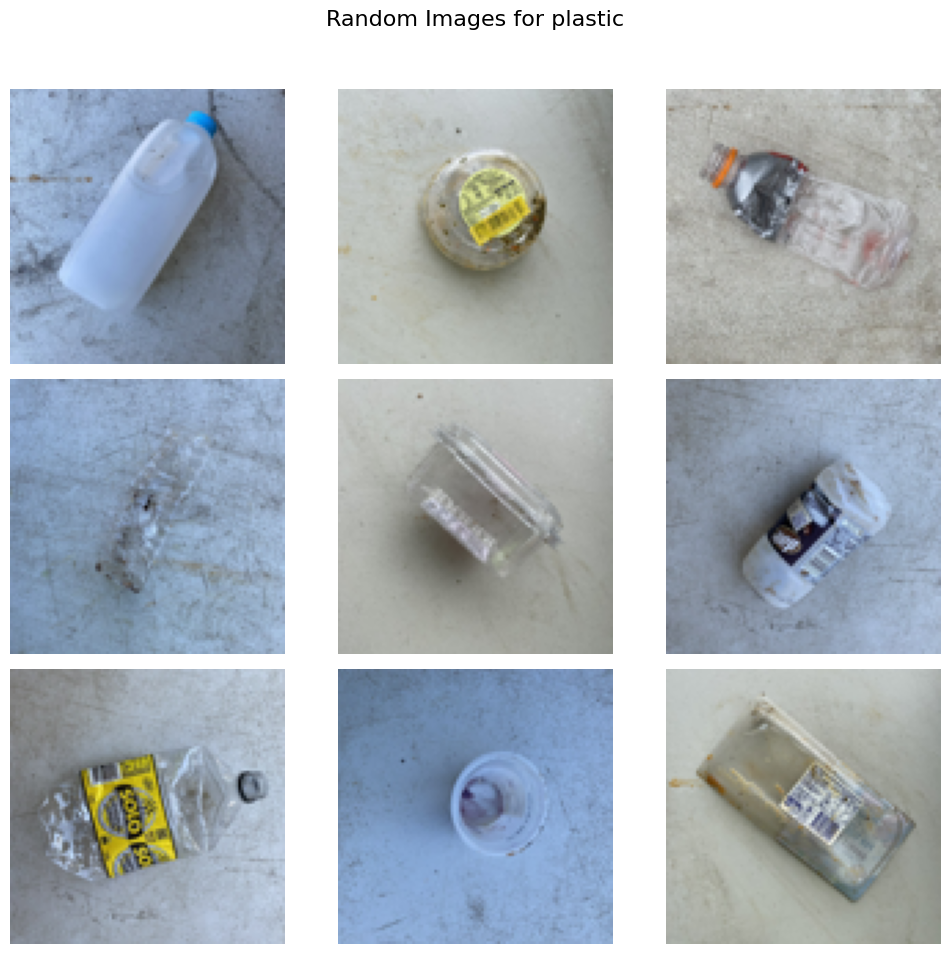

In [ ]:
def display_images_grid(material_folder):
    material_path = os.path.join(IMAGE_DATASET, material_folder)
    images = [f for f in os.listdir(material_path)]
    selected_images = random.sample(images, min(9, len(images)))

    fig, axes = plt.subplots(3, 3, figsize=(10, 10))
    fig.suptitle(f"Random Images for {material_folder}", fontsize=16)

    for i, image_name in enumerate(selected_images):
        image_path = os.path.join(material_path, image_name)
        try:
            img = Image.open(image_path)
            img.thumbnail((100, 100))
            row = i // 3
            col = i % 3
            axes[row, col].imshow(img)
            axes[row, col].axis('off')
        except Exception as e:
            print(f"Error displaying image {image_path}: {e}")

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

for material_folder in materials_folders:
    display_images_grid(material_folder)

In [ ]:
def split_dataset(source_dir, train_dir, val_dir, test_dir, train_ratio=0.6, val_ratio=0.2, test_ratio=0.2):
    if not os.path.exists(train_dir):
        os.makedirs(train_dir)
    if not os.path.exists(val_dir):
        os.makedirs(val_dir)
    if not os.path.exists(test_dir):
        os.makedirs(test_dir)

    for material_folder in os.listdir(source_dir):
        material_source_path = os.path.join(source_dir, material_folder)
        if os.path.isdir(material_source_path):
            material_train_path = os.path.join(train_dir, material_folder)
            os.makedirs(material_train_path, exist_ok=True)
            material_val_path = os.path.join(val_dir, material_folder)
            os.makedirs(material_val_path, exist_ok=True)
            material_test_path = os.path.join(test_dir, material_folder)
            os.makedirs(material_test_path, exist_ok=True)

            images = [f for f in os.listdir(material_source_path) if f not in to_skip and os.path.isfile(os.path.join(material_source_path, f))]
            random.shuffle(images)

            train_split = int(len(images) * train_ratio)
            val_split = int(len(images) * (train_ratio + val_ratio))

            for i, image in enumerate(images):
              source_path = os.path.join(material_source_path, image)
              if i < train_split:
                  destination_path = os.path.join(material_train_path, image)
              elif i < val_split:
                  destination_path = os.path.join(material_val_path, image)
              else:
                  destination_path = os.path.join(material_test_path, image)
              shutil.copy2(source_path, destination_path)

train_dir = f'/content/drive/My Drive/{FOLDER_NAME}/dataset/train/materials'
val_dir = f'/content/drive/My Drive/{FOLDER_NAME}/dataset/val/materials'
test_dir = f'/content/drive/My Drive/{FOLDER_NAME}/dataset/test/materials'

split_dataset(IMAGE_DATASET, train_dir, val_dir, test_dir)

In [ ]:
train_dir = f'/content/drive/My Drive/{FOLDER_NAME}/dataset/train/materials'
val_dir = f'/content/drive/My Drive/{FOLDER_NAME}/dataset/val/materials'
test_dir = f'/content/drive/My Drive/{FOLDER_NAME}/dataset/test/materials'

total_train, total_val, total_test = 0, 0, 0

for material_folder in materials_folders:
  dir_path = os.path.join(train_dir, material_folder)
  train_images = len(os.listdir(dir_path))
  dir_path = os.path.join(val_dir, material_folder)
  val_images = len(os.listdir(dir_path))
  dir_path = os.path.join(test_dir, material_folder)
  test_images = len(os.listdir(dir_path))

  total_train += train_images
  total_val += val_images
  total_test += test_images

  print(f'{material_folder}: train={train_images}, val={val_images}, test={test_images}')
  assert train_images + val_images + test_images == image_counts[material_folder]

print(f'Total train images: {total_train}')
print(f'Total val images: {total_val}')
print(f'Total test images: {total_test}')

paper: train=300, val=100, test=100
metal: train=474, val=158, test=158
cardboard: train=276, val=92, test=93
food_organics: train=246, val=82, test=83
glass: train=252, val=84, test=84
vegetation: train=261, val=87, test=88
textile_trash: train=190, val=64, test=64
miscellaneous_trash: train=297, val=99, test=99
plastic: train=552, val=184, test=185
Total train images: 2848
Total val images: 950
Total test images: 954


In [ ]:
image_sizes = {}
dirs = [train_dir, val_dir, test_dir]
for dir in dirs:
  print(dir)
  materials = os.listdir(dir)
  for material in materials:
    images = os.listdir(os.path.join(dir, material))
    for image in images:
      image_path = os.path.join(dir, material, image)
      with Image.open(image_path) as img:
        width, height = img.size
        image_size = (width, height)
        if image_size not in image_sizes:
          image_sizes[image_size] = 1
        else:
          image_sizes[image_size] += 1
print(image_sizes)

/content/drive/My Drive/mlzoomcamp/capstone2/dataset/train/materials
/content/drive/My Drive/mlzoomcamp/capstone2/dataset/val/materials
/content/drive/My Drive/mlzoomcamp/capstone2/dataset/test/materials
{(524, 524): 4752}


In [ ]:
sorted_image_sizes = dict(sorted(image_sizes.items(), key=lambda item: item[1], reverse=True))
sorted_image_sizes

{(524, 524): 4752}

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow import keras
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.applications.xception import Xception
from tensorflow.keras.applications.xception import preprocess_input
from tensorflow.keras.applications.xception import decode_predictions
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

In [ ]:
tf.__version__, keras.__version__

('2.17.1', '3.5.0')

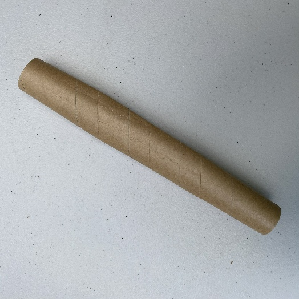

In [ ]:
img = load_img(f'{train_dir}/cardboard/Cardboard_1.jpg', target_size=(299, 299))
x = np.array(img)
img
# x.shape

In [ ]:
model = Xception(
    weights='imagenet',
    input_shape=(299, 299, 3)
)

In [ ]:
X = np.array([x])
X.shape

(1, 299, 299, 3)

In [ ]:
X = preprocess_input(X)
X.shape

(1, 299, 299, 3)

In [ ]:
pred = model.predict(X)
pred.shape

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


(1, 1000)

In [ ]:
decode_predictions(pred)

[[('n03481172', 'hammer', 0.58547986),
  ('n03250847', 'drumstick', 0.065824814),
  ('n04597913', 'wooden_spoon', 0.029836183),
  ('n03786901', 'mortar', 0.026905501),
  ('n03498962', 'hatchet', 0.013449126)]]

In [ ]:
train_gen = ImageDataGenerator(preprocessing_function=preprocess_input)
train_ds = train_gen.flow_from_directory(
    train_dir, target_size=(150, 150), batch_size=32
)
train_ds.class_indices

Found 2848 images belonging to 9 classes.


{'cardboard': 0,
 'food_organics': 1,
 'glass': 2,
 'metal': 3,
 'miscellaneous_trash': 4,
 'paper': 5,
 'plastic': 6,
 'textile_trash': 7,
 'vegetation': 8}

In [ ]:
val_gen = ImageDataGenerator(preprocessing_function=preprocess_input)
val_ds = val_gen.flow_from_directory(
    val_dir, target_size=(150, 150), batch_size=32, shuffle=False
)

Found 950 images belonging to 9 classes.


In [ ]:
base_model = Xception(
    weights='imagenet', include_top=False, input_shape=(150, 150, 3)
)
base_model.trainable = False
inputs = keras.Input(shape=(150, 150, 3))
base = base_model(inputs, training=False)
vectors = keras.layers.GlobalAveragePooling2D()(base)
outputs = keras.layers.Dense(9)(vectors)
model = keras.Model(inputs, outputs)

In [ ]:
img = load_img(f'{train_dir}/cardboard/Cardboard_1.jpg', target_size=(150, 150))
x = np.array(img)
X = np.array([x])
X = preprocess_input(X)

In [ ]:
preds = model.predict(X)
preds.shape

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


(1, 9)

In [ ]:
learning_rate = 0.01
optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
loss = keras.losses.CategoricalCrossentropy(from_logits=True)
model.compile(optimizer=optimizer, loss = loss, metrics=['accuracy'])
history = model.fit(train_ds, epochs=10, validation_data=val_ds)

Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


89/89 ━━━━━━━━━━━━━━━━━━━━ 40s 310ms/step - accuracy: 0.4626 - loss: 2.0969 - val_accuracy: 0.6779 - val_loss: 1.1894
Epoch 2/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 22s 229ms/step - accuracy: 0.7834 - loss: 0.6325 - val_accuracy: 0.6747 - val_loss: 1.2668
Epoch 3/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 21s 226ms/step - accuracy: 0.8585 - loss: 0.4007 - val_accuracy: 0.6937 - val_loss: 1.2250
Epoch 4/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 21s 227ms/step - accuracy: 0.8919 - loss: 0.3194 - val_accuracy: 0.6274 - val_loss: 1.9020
Epoch 5/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 21s 227ms/step - accuracy: 0.8912 - loss: 0.3834 - val_accuracy: 0.6905 - val_loss: 1.3578
Epoch 6/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 22s 226ms/step - accuracy: 0.9616 - loss: 0.1293 - val_accuracy: 0.7000 - val_loss: 1.3014
Epoch 7/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 21s 226ms/step - accuracy: 0.9764 - loss: 0.0728 - val_accuracy: 0.7000 - val_loss: 1.3384
Epoch 8/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 21s 228ms/step - accuracy: 0.9660 - loss: 0.1049 - val_accuracy: 0.712

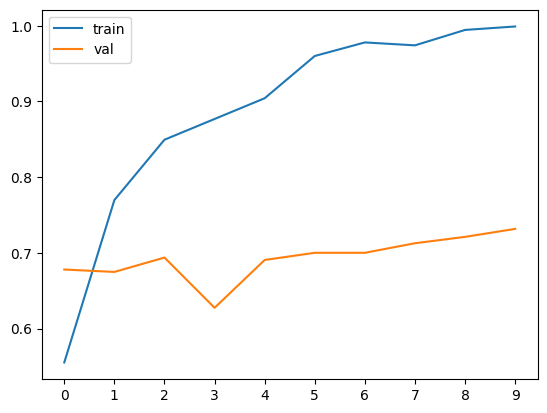

In [ ]:
plt.plot(history.history['accuracy'], label='train')
plt.plot(history.history['val_accuracy'], label='val')
plt.xticks(np.arange(10))
plt.legend()

In [ ]:
def make_model(learning_rate=0.01, size_inner=100):
    base_model = Xception(
    weights='imagenet', include_top=False, input_shape=(150, 150, 3)
    )
    base_model.trainable = False
    ###########################################
    inputs = keras.Input(shape=(150, 150, 3))
    base = base_model(inputs, training=False)
    vectors = keras.layers.GlobalAveragePooling2D()(base)
    inner = keras.layers.Dense(size_inner, activation='relu')(vectors)
    outputs = keras.layers.Dense(9)(inner)
    ###########################################
    optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
    loss = keras.losses.CategoricalCrossentropy(from_logits=True)
    model = keras.Model(inputs, outputs)
    model.compile(optimizer=optimizer, loss = loss, metrics=['accuracy'])
    return model

In [ ]:
scores = {}
for lr in [0.0001, 0.001, 0.01, 0.1]:
    print(f'Learning rate: {lr}')
    model = make_model(learning_rate=lr)
    history = model.fit(train_ds, epochs=10, validation_data=val_ds)
    scores[lr] = history.history
    print()

Learning rate: 0.0001
Epoch 1/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 33s 285ms/step - accuracy: 0.2787 - loss: 1.9987 - val_accuracy: 0.5337 - val_loss: 1.4225
Epoch 2/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 22s 237ms/step - accuracy: 0.5868 - loss: 1.2888 - val_accuracy: 0.6232 - val_loss: 1.1356
Epoch 3/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 22s 231ms/step - accuracy: 0.6928 - loss: 0.9796 - val_accuracy: 0.6621 - val_loss: 1.0248
Epoch 4/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 22s 229ms/step - accuracy: 0.7372 - loss: 0.8347 - val_accuracy: 0.6779 - val_loss: 0.9644
Epoch 5/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 22s 228ms/step - accuracy: 0.7648 - loss: 0.7367 - val_accuracy: 0.6800 - val_loss: 0.9228
Epoch 6/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 21s 226ms/step - accuracy: 0.8076 - loss: 0.6438 - val_accuracy: 0.6895 - val_loss: 0.8958
Epoch 7/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 22s 228ms/step - accuracy: 0.8212 - loss: 0.5782 - val_accuracy: 0.7053 - val_loss: 0.8690
Epoch 8/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 22s 233ms/step - accuracy: 0.8495 - l

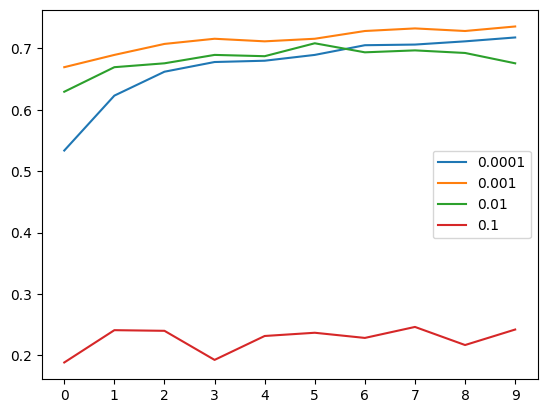

In [ ]:
for lr, hist in scores.items():
    plt.plot(hist['val_accuracy'], label=lr)
plt.xticks(np.arange(10))
plt.legend()

In [ ]:
learning_rate = 0.001
scores = {}
for size in [10, 100, 1000]:
    print(f'Inner layer size: {size}')
    model = make_model(learning_rate=learning_rate, size_inner=size)
    history = model.fit(train_ds, epochs=10, validation_data=val_ds)
    scores[size] = history.history
    print()

Inner layer size: 10
Epoch 1/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 33s 281ms/step - accuracy: 0.2727 - loss: 1.9262 - val_accuracy: 0.5274 - val_loss: 1.3601
Epoch 2/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 22s 232ms/step - accuracy: 0.5676 - loss: 1.2422 - val_accuracy: 0.5863 - val_loss: 1.1247
Epoch 3/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 22s 228ms/step - accuracy: 0.6682 - loss: 0.9625 - val_accuracy: 0.6379 - val_loss: 1.0111
Epoch 4/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 22s 227ms/step - accuracy: 0.7343 - loss: 0.7814 - val_accuracy: 0.6758 - val_loss: 0.9347
Epoch 5/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 22s 229ms/step - accuracy: 0.8062 - loss: 0.6219 - val_accuracy: 0.6758 - val_loss: 0.9274
Epoch 6/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 21s 227ms/step - accuracy: 0.8337 - loss: 0.5300 - val_accuracy: 0.6989 - val_loss: 0.8739
Epoch 7/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 22s 232ms/step - accuracy: 0.8635 - loss: 0.4495 - val_accuracy: 0.6874 - val_loss: 0.8730
Epoch 8/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 22s 232ms/step - accuracy: 0.8939 - lo

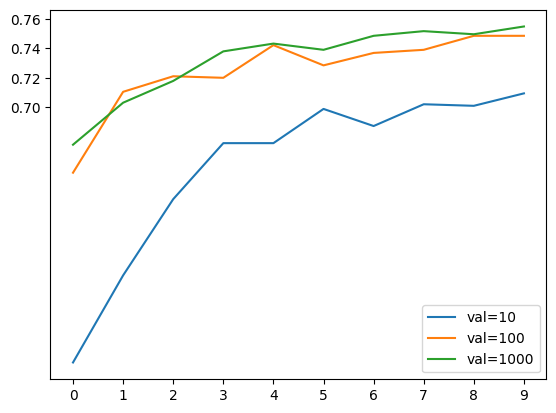

In [ ]:
for size, hist in scores.items():
    plt.plot(hist['val_accuracy'], label=f'val={size}')
plt.xticks(np.arange(10))
plt.yticks([0.70, 0.72, 0.74, 0.76])
plt.legend()

In [ ]:
def make_model(learning_rate=0.01, size_inner=100, droprate=0.5):
    base_model = Xception(
    weights='imagenet', include_top=False, input_shape=(150, 150, 3)
    )
    base_model.trainable = False
    ###########################################
    inputs = keras.Input(shape=(150, 150, 3))
    base = base_model(inputs, training=False)
    vectors = keras.layers.GlobalAveragePooling2D()(base)
    inner = keras.layers.Dense(size_inner, activation='relu')(vectors)
    drop = keras.layers.Dropout(droprate)(inner)
    outputs = keras.layers.Dense(9)(drop)
    ###########################################
    optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
    loss = keras.losses.CategoricalCrossentropy(from_logits=True)
    model = keras.Model(inputs, outputs)
    model.compile(optimizer=optimizer, loss = loss, metrics=['accuracy'])
    return model

In [ ]:
learning_rate = 0.001
size = 1000

scores = {}
for droprate in [0.0, 0.2, 0.5, 0.8]:
    print(f'Droprate: {droprate}')
    model = make_model(learning_rate=learning_rate, size_inner=size, droprate=droprate)
    history = model.fit(train_ds, epochs=30, validation_data=val_ds)
    scores[droprate] = history.history
    print()

Droprate: 0.0
Epoch 1/30
89/89 ━━━━━━━━━━━━━━━━━━━━ 31s 268ms/step - accuracy: 0.5073 - loss: 1.4668 - val_accuracy: 0.6568 - val_loss: 0.9493
Epoch 2/30
89/89 ━━━━━━━━━━━━━━━━━━━━ 22s 235ms/step - accuracy: 0.8037 - loss: 0.5444 - val_accuracy: 0.7105 - val_loss: 0.8416
Epoch 3/30
89/89 ━━━━━━━━━━━━━━━━━━━━ 22s 230ms/step - accuracy: 0.9000 - loss: 0.2991 - val_accuracy: 0.7179 - val_loss: 0.9029
Epoch 4/30
89/89 ━━━━━━━━━━━━━━━━━━━━ 22s 228ms/step - accuracy: 0.9647 - loss: 0.1538 - val_accuracy: 0.7305 - val_loss: 0.9081
Epoch 5/30
89/89 ━━━━━━━━━━━━━━━━━━━━ 22s 233ms/step - accuracy: 0.9854 - loss: 0.0817 - val_accuracy: 0.7463 - val_loss: 0.8719
Epoch 6/30
89/89 ━━━━━━━━━━━━━━━━━━━━ 22s 236ms/step - accuracy: 0.9932 - loss: 0.0415 - val_accuracy: 0.7505 - val_loss: 0.9201
Epoch 7/30
89/89 ━━━━━━━━━━━━━━━━━━━━ 23s 239ms/step - accuracy: 0.9999 - loss: 0.0229 - val_accuracy: 0.7505 - val_loss: 0.9309
Epoch 8/30
89/89 ━━━━━━━━━━━━━━━━━━━━ 22s 235ms/step - accuracy: 1.0000 - loss: 0.0

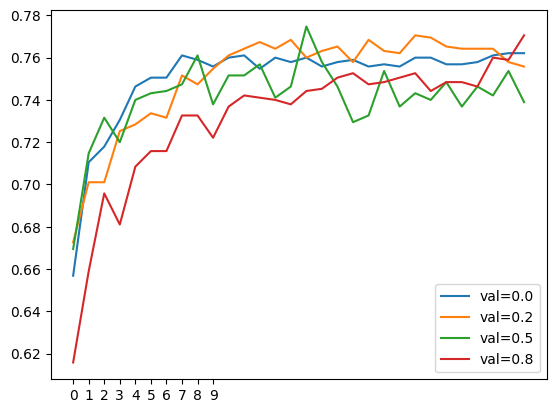

In [ ]:
for droprate, hist in scores.items():
    plt.plot(hist['val_accuracy'], label=f'val={droprate}')
plt.xticks(np.arange(10))
# plt.yticks([0.78, 0.80, 0.82, 0.825, 0.83])
# plt.ylim(0.9, 0.93)
plt.legend()

In [ ]:
def make_model(input_size=150, learning_rate=0.01, size_inner=100, droprate=0.5):
    base_model = Xception(
    weights='imagenet', include_top=False, input_shape=(input_size, input_size, 3)
    )
    base_model.trainable = False
    ###########################################
    inputs = keras.Input(shape=(input_size, input_size, 3))
    base = base_model(inputs, training=False)
    vectors = keras.layers.GlobalAveragePooling2D()(base)
    inner = keras.layers.Dense(size_inner, activation='relu')(vectors)
    drop = keras.layers.Dropout(droprate)(inner)
    outputs = keras.layers.Dense(9)(drop)
    ###########################################
    optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
    loss = keras.losses.CategoricalCrossentropy(from_logits=True)
    model = keras.Model(inputs, outputs)
    model.compile(optimizer=optimizer, loss = loss, metrics=['accuracy'])
    return model

In [ ]:
input_size = 299

train_gen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    shear_range=10,
    zoom_range=0.1,
    vertical_flip=False,
    horizontal_flip=True,
)
train_ds = train_gen.flow_from_directory(
    train_dir, target_size=(input_size, input_size), batch_size=32
)

val_gen = ImageDataGenerator(preprocessing_function=preprocess_input)
val_ds = val_gen.flow_from_directory(
    val_dir, target_size=(input_size, input_size), batch_size=32, shuffle=False
)

Found 2848 images belonging to 9 classes.
Found 950 images belonging to 9 classes.


In [ ]:
checkpoint = keras.callbacks.ModelCheckpoint(
    'xception_{epoch:02d}_{val_accuracy:.3f}.keras',
    save_best_only=True,
    monitor='val_accuracy',
    mode='max'
)

In [ ]:
input_size = 299
learning_rate = 0.001
size_inner = 1000
droprate = 0.2

model = make_model(input_size=input_size, learning_rate=learning_rate, size_inner=size_inner, droprate=droprate)
history = model.fit(train_ds, epochs=50, validation_data=val_ds, callbacks=[checkpoint])

Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


89/89 ━━━━━━━━━━━━━━━━━━━━ 108s 920ms/step - accuracy: 0.5781 - loss: 1.2446 - val_accuracy: 0.7400 - val_loss: 0.6997
Epoch 2/50
89/89 ━━━━━━━━━━━━━━━━━━━━ 72s 747ms/step - accuracy: 0.7812 - loss: 0.5906 - val_accuracy: 0.7853 - val_loss: 0.5783
Epoch 3/50
89/89 ━━━━━━━━━━━━━━━━━━━━ 71s 742ms/step - accuracy: 0.8399 - loss: 0.4481 - val_accuracy: 0.7853 - val_loss: 0.5905
Epoch 4/50
89/89 ━━━━━━━━━━━━━━━━━━━━ 71s 741ms/step - accuracy: 0.8593 - loss: 0.3952 - val_accuracy: 0.7863 - val_loss: 0.6184
Epoch 5/50
89/89 ━━━━━━━━━━━━━━━━━━━━ 72s 752ms/step - accuracy: 0.8976 - loss: 0.2870 - val_accuracy: 0.8000 - val_loss: 0.5667
Epoch 6/50
89/89 ━━━━━━━━━━━━━━━━━━━━ 72s 755ms/step - accuracy: 0.9198 - loss: 0.2306 - val_accuracy: 0.8105 - val_loss: 0.5771
Epoch 7/50
89/89 ━━━━━━━━━━━━━━━━━━━━ 70s 731ms/step - accuracy: 0.9349 - loss: 0.1898 - val_accuracy: 0.8053 - val_loss: 0.5875
Epoch 8/50
89/89 ━━━━━━━━━━━━━━━━━━━━ 72s 755ms/step - accuracy: 0.9537 - loss: 0.1437 - val_accuracy: 0.81

In [ ]:
trained_model = keras.models.load_model('xception_31_0.844.keras')
input_size = 299
test_gen = ImageDataGenerator(preprocessing_function=preprocess_input)
test_ds = test_gen.flow_from_directory(
    test_dir, target_size=(input_size, input_size), batch_size=32, shuffle=False
)
trained_model.evaluate(test_ds)

Found 954 images belonging to 9 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


30/30 ━━━━━━━━━━━━━━━━━━━━ 27s 778ms/step - accuracy: 0.8280 - loss: 0.9111


[0.8104881644248962, 0.8364779949188232]

In [ ]:
trained_model.summary()

Model: "functional_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_29 (InputLayer)          │ (None, 299, 299, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ xception (Functional)                │ (None, 10, 10, 2048)        │      20,861,480 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_13          │ (None, 2048)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_24 (Dense)                     │ (None, 1000)                │       2,049,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 1000)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_25 (Dense)                     │ (None, 9)                   │           9,009 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 27,035,509 (103.13 MB)

 Trainable params: 2,058,009 (7.85 MB)

 Non-trainable params: 20,861,480 (79.58 MB)

 Optimizer params: 4,116,020 (15.70 MB)

In [ ]:
classes = ['cardboard', 'food_organics', 'glass', 'metal', 'miscellaneous_trash', 'paper', 'plastic', 'textile_trash', 'vegetation']
# path = f'{test_dir}/cardboard/Cardboard_32.jpg'
# path = f'{test_dir}/food_organics/Food Organics_54.jpg'
# path = f'{test_dir}/vegetation/Vegetation_62.jpg' # predicted wrongly as food_organics
path = f'{test_dir}/vegetation/Vegetation_59.jpg'

img = load_img(path, target_size=(input_size, input_size))
# img
x = np.array(img)
X = np.array([x])
X = preprocess_input(X)
pred = trained_model.predict(X)
all = dict(zip(classes, pred[0]))
predicted_material = max(all, key=all.get)
print(f'Predicted material: {predicted_material}')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Predicted material: vegetation


In [ ]:
def predict_material(model, image_path):
    classes = ['cardboard', 'food_organics', 'glass', 'metal', 'miscellaneous_trash', 'paper', 'plastic', 'textile_trash', 'vegetation']
    img = load_img(image_path, target_size=(299, 299))
    x = np.array(img)
    X = np.array([x])
    X = preprocess_input(X)
    pred = model.predict(X)
    all_probs = dict(zip(classes, pred[0]))
    predicted_material = max(all_probs, key=all_probs.get)
    return predicted_material


In [ ]:
result = {}
for material_folder in os.listdir(test_dir):
  material_path = os.path.join(test_dir, material_folder)
  if os.path.isdir(material_path):
    correct, wrong = 0, 0
    for image_file in os.listdir(material_path):
      image_path = os.path.join(material_path, image_file)
      predicted_material = predict_material(trained_model, image_path)
      # print(f'Actual material: {material_folder}, Predicted material: {predicted_material}')
      if material_folder == predicted_material:
        correct += 1
      else:
        wrong += 1
    result[material_folder] = (correct, wrong)
print(result)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━

30/30 ━━━━━━━━━━━━━━━━━━━━ 6s 214ms/step
                     precision    recall  f1-score   support

          cardboard       0.72      0.85      0.78        93
      food_organics       0.90      0.86      0.88        83
              glass       0.91      0.85      0.88        84
              metal       0.86      0.82      0.84       158
miscellaneous_trash       0.74      0.74      0.74        99
              paper       0.88      0.85      0.86       100
            plastic       0.84      0.78      0.81       185
      textile_trash       0.79      0.94      0.86        64
         vegetation       0.91      0.97      0.94        88

           accuracy                           0.84       954
          macro avg       0.84      0.85      0.84       954
       weighted avg       0.84      0.84      0.84       954



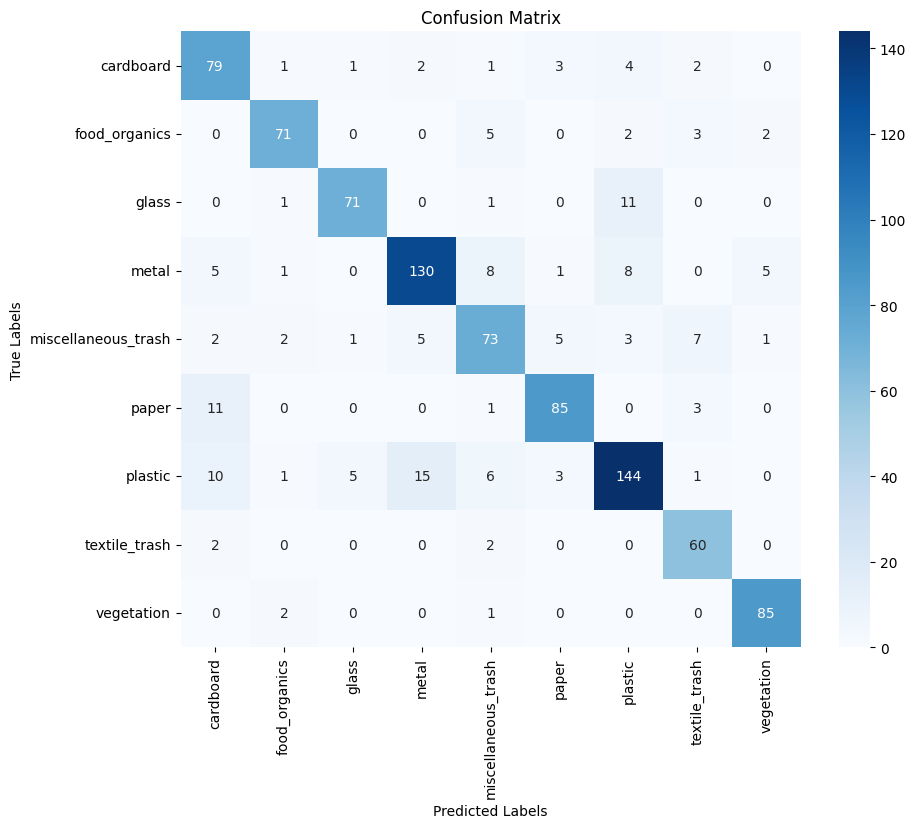

In [ ]:
true_labels = test_ds.classes
predictions = trained_model.predict(test_ds)
predicted_labels = np.argmax(predictions, axis=1)

class_names = list(test_ds.class_indices.keys())
report = classification_report(true_labels, predicted_labels, target_names=class_names)
print(report)

cm = confusion_matrix(true_labels, predicted_labels)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

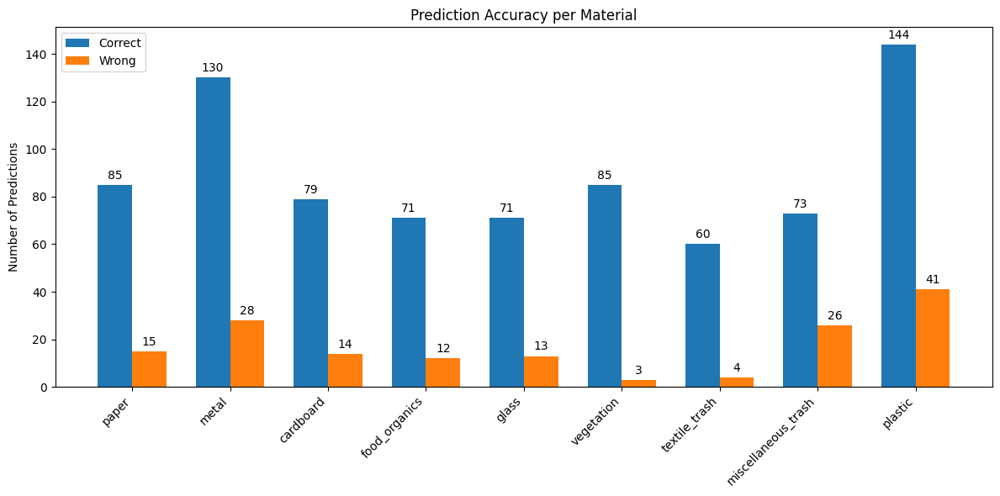

In [ ]:
materials = list(result.keys())
correct_predictions = [result[material][0] for material in materials]
wrong_predictions = [result[material][1] for material in materials]

x = np.arange(len(materials))
width = 0.35

fig, ax = plt.subplots(figsize=(12, 6))
rects1 = ax.bar(x - width/2, correct_predictions, width, label='Correct')
rects2 = ax.bar(x + width/2, wrong_predictions, width, label='Wrong')

ax.set_ylabel('Number of Predictions')
ax.set_title('Prediction Accuracy per Material')
ax.set_xticks(x)
ax.set_xticklabels(materials, rotation=45, ha='right')
ax.legend()

def autolabel(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),
                    textcoords="offset points",
                    ha='center', va='bottom')

autolabel(rects1)
autolabel(rects2)

fig.tight_layout()
plt.show()

In [ ]:
from keras.preprocessing.image import load_img
from keras.applications.xception import preprocess_input
import tensorflow.lite as tflite

In [ ]:
MODEL_KERAS = f'/content/drive/My Drive/{FOLDER_NAME}/xception_31_0.844.keras'

In [ ]:
model = keras.models.load_model(MODEL_KERAS)
MODEL_TFLITE = f'/content/drive/My Drive/{FOLDER_NAME}/xception_31_0.844.tflite'
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()
with open(MODEL_TFLITE, 'wb') as f_out:
    f_out.write(tflite_model)

Saved artifact at '/tmp/tmp7sddi1s_'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 299, 299, 3), dtype=tf.float32, name='input_layer_29')
Output Type:
  TensorSpec(shape=(None, 9), dtype=tf.float32, name=None)
Captures:
  135157459614224: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135157459615376: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135157459615568: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135157459602320: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135157459614032: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135157459612880: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135157459611728: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135157459611536: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135157459611920: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135157459613072: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135157459611

In [ ]:
interpreter = tflite.Interpreter(model_path=MODEL_TFLITE)
interpreter.allocate_tensors()
interpreter.get_input_details()
input_index = interpreter.get_input_details()[0]['index']
output_index = interpreter.get_output_details()[0]['index']

In [ ]:
from io import BytesIO
from urllib import request

from PIL import Image

def download_image(url):
    with request.urlopen(url) as resp:
        buffer = resp.read()
    stream = BytesIO(buffer)
    img = Image.open(stream)
    return img


def prepare_image(img, target_size):
    if img.mode != 'RGB':
        img = img.convert('RGB')
    img = img.resize(target_size, Image.NEAREST)
    return img

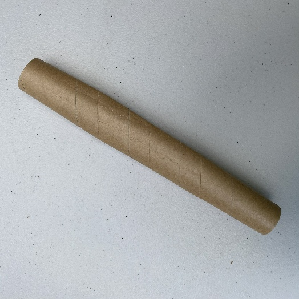

In [ ]:
url = 'https://raw.githubusercontent.com/vladflore/machine-learning-zoomcamp-cohort-2024/refs/heads/main/capstone2/Cardboard_1.jpg'
img = download_image(url=url)
img = prepare_image(img, target_size=(299, 299))
img

In [ ]:
def preprocess_input(x):
    print('Preprocessing input...')
    # x /= 127.5
    # x -= 1.
    x /= 255.0
    return x

In [ ]:
img = download_image(url=url)
img = prepare_image(img, target_size=(299, 299))
x = np.array(img, dtype='float32')
X = np.array([x])
X = preprocess_input(X)
X.shape

Preprocessing input...


(1, 299, 299, 3)

In [ ]:
interpreter.set_tensor(input_index, X)
interpreter.invoke()
preds = interpreter.get_tensor(output_index)
preds = model.predict(X)
preds[0]

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


array([ 10.960523 ,  -9.893529 ,  -9.799603 ,  -3.3133035,   1.7302477,
        -4.8139625,  -2.0825598,  -1.4370662, -11.442691 ], dtype=float32)

In [ ]:
classes = ['cardboard', 'food_organics', 'glass', 'metal', 'miscellaneous_trash', 'paper', 'plastic', 'textile_trash', 'vegetation']
all = dict(zip(classes, preds[0]))
predicted_material = max(all, key=all.get)
print(f'Predicted material: {predicted_material}')

Predicted material: cardboard


In [ ]:
!pip install keras-image-helper

In [ ]:
from keras_image_helper import create_preprocessor
preprocessor = create_preprocessor('xception', target_size=(299, 299))
X = preprocessor.from_url(url)
interpreter.set_tensor(input_index, X)
interpreter.invoke()
preds = interpreter.get_tensor(output_index)
preds[0]

array([ 11.783807 ,  -9.875271 , -12.8809805,  -1.8666252,   1.2151753,
        -5.8722267,  -3.6575716,  -1.3121834, -10.030109 ], dtype=float32)

In [ ]:
!pip install --extra-index-url https://google-coral.github.io/py-repo/ tflite-runtime

Looking in indexes: https://pypi.org/simple, https://google-coral.github.io/py-repo/
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 82.2 MB/s eta 0:00:00


In [ ]:
import tflite_runtime.interpreter as tflite
interpreter = tflite.Interpreter(model_path=MODEL_TFLITE)
interpreter.allocate_tensors()
input_index = interpreter.get_input_details()[0]['index']
output_index = interpreter.get_output_details()[0]['index']
preprocessor = create_preprocessor('xception', target_size=(299, 299))
X = preprocessor.from_url(url)
interpreter.set_tensor(input_index, X)
interpreter.invoke()
preds = interpreter.get_tensor(output_index)
preds

array([[ 11.783805 ,  -9.875269 , -12.880977 ,  -1.8666261,   1.2151752,
         -5.87223  ,  -3.657571 ,  -1.3121837, -10.03011  ]],
      dtype=float32)

In [ ]:
import tflite_runtime.interpreter as tflite
from keras_image_helper import create_preprocessor

from io import BytesIO
from urllib import request
from PIL import Image
import numpy as np

preprocessor = create_preprocessor('xception', target_size=(299, 299))
interpreter = tflite.Interpreter(model_path=MODEL_TFLITE)
interpreter.allocate_tensors()
input_index = interpreter.get_input_details()[0]['index']
output_index = interpreter.get_output_details()[0]['index']

def download_image(url):
    with request.urlopen(url) as resp:
        buffer = resp.read()
    stream = BytesIO(buffer)
    img = Image.open(stream)
    return img

def prepare_image(img, target_size):
    if img.mode != 'RGB':
        img = img.convert('RGB')
    img = img.resize(target_size, Image.NEAREST)
    return img

def preprocess_input(x):
    x /= 255.0
    # x -= 1.
    return x

def read_img(url):
    img=download_image(url)
    img=prepare_image(img,(299,299))
    x = np.array(img, dtype='float32')
    X = np.array([x])
    X = preprocess_input(X)
    return X


def predict(url):
    X = preprocessor.from_url(url)
    # X = read_img(url)
    interpreter.set_tensor(input_index, X)
    interpreter.invoke()
    preds = interpreter.get_tensor(output_index)
    return preds[0]

def lambda_handler(event, context):
    url = event['url']
    return predict(url)


In [ ]:
cardboard_url = 'https://raw.githubusercontent.com/vladflore/machine-learning-zoomcamp-cohort-2024/refs/heads/main/capstone2/Cardboard_1.jpg'
event = {
    'url': cardboard_url
}
preds = lambda_handler(event, None)
all = dict(zip(classes, preds))
predicted_material = max(all, key=all.get)
print(f'Predicted material: {predicted_material}')

Predicted material: cardboard
